本篇notebook用于使用整理好的所有数据，用以可视化分析，并得出有参考性的结论

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ast import literal_eval # 将字符转成应有的数据类型,literal表示字面量，即原本是什么类型，eval表示评估
import re
from sklearn.preprocessing import MinMaxScaler

### 加载数据

In [2]:
df = pd.read_csv('../../data/processed/Total_data.csv')
df.head()

,Unnamed: 0,Unnamed: 0_x,steamid,communityvisibilitystate,profilestate,personaname,profileurl,avatar,avatarmedium,avatarfull,...,Sports_weighted_playtime (in_minutes),MassivelyMultiplayer_weighted_playtime (in_minutes),RPG_weighted_playtime (in_minutes),Strategy_weighted_playtime (in_minutes),Casual_weighted_playtime (in_minutes),total_price(dollar),Principal Component 1,Principal Component 2,Principal Component 3,Cluster_Labels
0,0,0,76561197960269904,3,1,ツxxツ,https://steamcommunity.com/id/xcari/,https://avatars.steamstatic.com/c8499ee4d5ebde...,https://avatars.steamstatic.com/c8499ee4d5ebde...,https://avatars.steamstatic.com/c8499ee4d5ebde...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1,76561197960280448,3,1,recon,https://steamcommunity.com/id/pzrecon/,https://avatars.steamstatic.com/628974cb0fcec1...,https://avatars.steamstatic.com/628974cb0fcec1...,https://avatars.steamstatic.com/628974cb0fcec1...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2,76561197960290464,3,1,JKBe,https://steamcommunity.com/profiles/7656119796...,https://avatars.steamstatic.com/c698ae39dd85c1...,https://avatars.steamstatic.com/c698ae39dd85c1...,https://avatars.steamstatic.com/c698ae39dd85c1...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,3,76561197960315952,3,1,chuNami5000,https://steamcommunity.com/id/chuNk--/,https://avatars.steamstatic.com/b16314c3aff86b...,https://avatars.steamstatic.com/b16314c3aff86b...,https://avatars.steamstatic.com/b16314c3aff86b...,...,1205.847002,0.0,0.0,0.0,0.0,145.0,0.269893,-2.917473,-0.245029,1.0
4,4,4,76561197960331200,3,1,Mikki,https://steamcommunity.com/profiles/7656119796...,https://avatars.steamstatic.com/fef49e7fa7e199...,https://avatars.steamstatic.com/fef49e7fa7e199...,https://avatars.steamstatic.com/fef49e7fa7e199...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
'''提取表格列信息，方便后续数据查阅并提取'''
# for idx, key in enumerate(df.columns):  
#     print(f'{idx}:{key}', end=' ')  # 使用 end=' ' 使得输出不自动换行
#     if (idx + 1) % 5 == 0:  # 每5个元素后换行
#         print()  # 执行换行操作

'提取表格列信息，方便后续数据查阅并提取'

### 预设sns默认设置

In [4]:
sns.set(
    context="notebook", # 设置整体类型
    style="whitegrid", # 设置背景格式
    palette="muted", 
    font="Times New Roman", # 设置字体类型
    font_scale=1.3, # 设置text的字体大小
    color_codes=True, # 启用颜色代码
    rc={                                # run command
    'figure.figsize': (20, 8),          # 图表尺寸
    'figure.dpi': 300,                  # 设置清晰度Dot per inch
    'axes.titlesize': 20,               # 坐标轴标题字体大小
    'axes.labelsize': 14,               # 坐标轴标签字体大小
    'xtick.labelsize': 12,              # x轴刻度标签字体大小
    'ytick.labelsize': 12,              # y轴刻度标签字体大小
    'grid.color': 'grey',               # 网格线颜色
    'grid.linestyle': '--',             # 网格线样式
    'lines.linewidth': 2,               # 线条宽度
    'lines.markersize': 6               # 标记大小
} 
)

### 单维度数据可视化——基础图形

#### 1. 理解玩家国籍分布情况

In [5]:
country_se = df['loccountrycode'] # 提取国籍列
grouped_country_se = country_se.groupby(country_se).agg( ['count'])  # 将country_se数据按国籍聚类
grouped_country_se = grouped_country_se.reset_index().sort_values(by='count', ascending= False).reset_index(drop=True) # 将country_se数据数据扁平化，排序并重新整理index
grouped_country_top_30_se = grouped_country_se.head(30) #提取前30列用于可视化
grouped_country_se # 展示国籍分布情况，可以看到共有220个国籍（除去未知）

,loccountrycode,count
0,Unknown,8416
1,FI,1889
2,US,1759
3,SE,1202
4,AU,1042
...,...,...
216,GY,1
217,TL,1
218,TO,1
219,NU,1


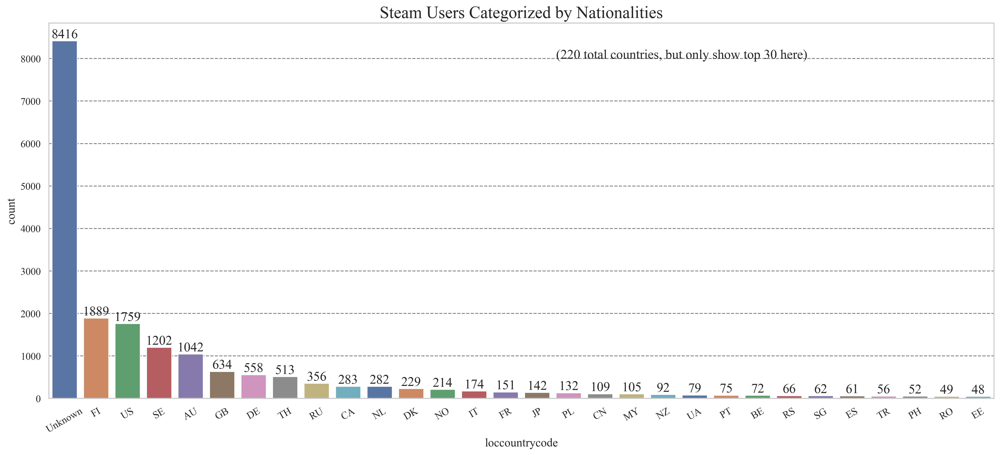

In [6]:
'''绘制柱形图'''

plt.xticks(rotation = 30) # 旋转横轴文字说明
plt.title(label='Steam Users Categorized by Nationalities')
ax = sns.barplot(data=grouped_country_top_30_se, x= 'loccountrycode', y= 'count', hue='loccountrycode', palette='deep')

# 添加注解
ax.text(x= 15.6, y= 8000, s = '(220 total countries, but only show top 30 here)')
for bar in ax.patches:  # ax.patches是条形图的集合
    ax.text(x = bar.get_x() + bar.get_width() / 2,  # x坐标，条形图中心
            y = bar.get_height(),  # y坐标，条形图顶部
            s = int(bar.get_height()),  # 标签，即条形图的高度，转换为整数
            ha='center',  # 水平居中,Horizontal Alignment（水平对齐）
            va='bottom')  # 从条形图顶部向下对齐,Vertical Alignment（垂直对齐）


总结如下结论：
-   **未知国家**：有8416名玩家的国籍为“Unknown”，占据了最大的一部分。这表明在数据收集中有大量的玩家缺少地理位置信息。
-   **靠前国家**：前十位分别为芬兰、美国、瑞典、澳大利亚、英国、德国、俄罗斯、加拿大、荷兰。这表明此次'random search'仍然存在一定区域性的偏差（更偏向于欧美市场），而不是更为全球化，因此后续的用户聚类识别得出的结论，更适合在这些国家做后续的市场营销与推广。


#### 2. 识别玩家创建日期

In [7]:
timecreated_se = pd.to_datetime(df['timecreated']) # 将原始数据转换为datetime
timecreated_se = timecreated_se.dt.year # 将数据转换为year
timecreated_se.dropna(inplace=True) # 剔除空值数据，以免无法转换为int
timecreated_se = timecreated_se.astype(int) 
timecreated_se = timecreated_se.groupby(by=timecreated_se).size() # 每组中的行数

C:\Users\55386\AppData\Local\Temp\ipykernel_15076\4047191101.py:3: SettingWithCopyWarning: modifications to a property of a datetimelike object are not supported and are discarded. Change values on the original.
  timecreated_se.dropna(inplace=True) # 剔除空值数据，以免无法转换为int


In [8]:
timecreated_df = pd.DataFrame(timecreated_se) # sns只能接受dataframe进行绘制
timecreated_df.columns = ['total_counts'] # 更名，避免reset_index列名冲突
timecreated_df.reset_index(inplace= True) # 将index转换为列

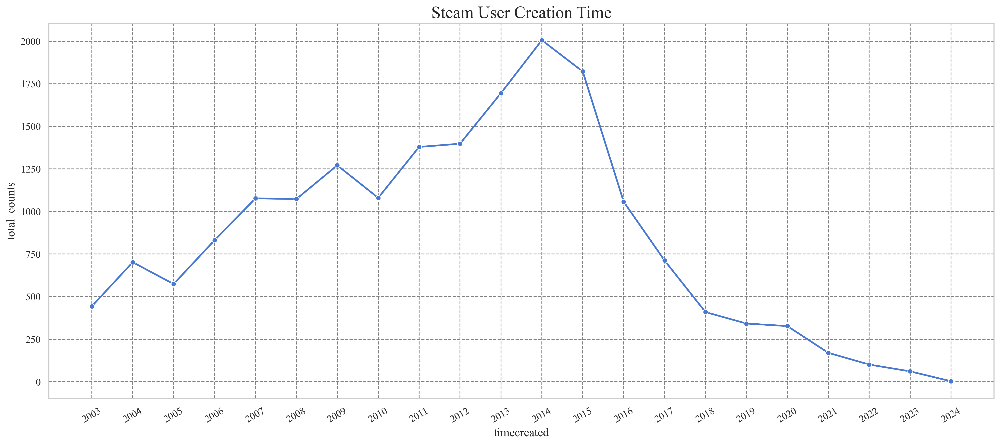

In [9]:
'''绘制柱形图'''

plt.xticks(range(2003, 2025),rotation = 30) # 旋转横轴文字说明
plt.title(label='Steam User Creation Time')
plt.grid(visible=True)
sns.lineplot(data=timecreated_df, x='timecreated', y='total_counts', marker='o')

# 添加注解

for bar in ax.patches:  # ax.patches是条形图的集合
    ax.text(x = bar.get_x() + bar.get_width() / 2,  # x坐标，条形图中心
            y = bar.get_height(),  # y坐标，条形图顶部
            s = int(bar.get_height()),  # 标签，即条形图的高度，转换为整数
            ha='center',  # 水平居中,Horizontal Alignment（水平对齐）
            va='bottom')  # 从条形图顶部向下对齐,Vertical Alignment（垂直对齐）


总体有如下结论：
-   **用户增长趋势**：从2003年到2014年，用户创建数量总体呈现增长趋势。特别是2009年、2013年和2014年，这三年用户创建数量显著增加，分别达到1271、1695和2006。
-   **波动趋势**：在2014年达到峰值后，用户创建数量开始波动下降，特别是2017年以后，用户创建数量显著减少，当然这可能与数据抓取逻辑有关，由于检索初始点，均在2003-2007年之间，因此用户数据可能会受初始点影响，而偏向于更靠前一些。

#### 3. 识别玩家游戏数量

In [10]:
'''整理数据'''

game_count_se = df['game_count']
game_count_df = game_count_se.reset_index()

# 定义区间边界
bins = [-1, 0] + list(range(10, 810, 20)) + [float('inf')] # infinite

# 生成labels
labels = [f"{bins[i]+1}-{bins[i+1]}" for i in range(len(bins)-1)]
labels[0] = "0"  # 特别处理第一个标签，只包含0
labels[-1] = f"{bins[-2]+1}+"  # 处理最后一个标签，表示超过最后一个有限数的值

# 使用 cut 函数进行分区
game_count_df['groups'] = pd.cut(game_count_df['game_count'], bins=bins, labels=labels) 

game_count_df = game_count_df.groupby('groups').size()
game_count_df = game_count_df.reset_index()
game_count_df.columns = ['groups','counts']
game_count_df['groups'] = game_count_df['groups'].astype(str) # 将原先cut后的Categorical数据转换成普通str，使得后续的图片能够正常显示
game_count_df = game_count_df[game_count_df['groups'] != '0']

C:\Users\55386\AppData\Local\Temp\ipykernel_15076\3690847402.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  game_count_df = game_count_df.groupby('groups').size()


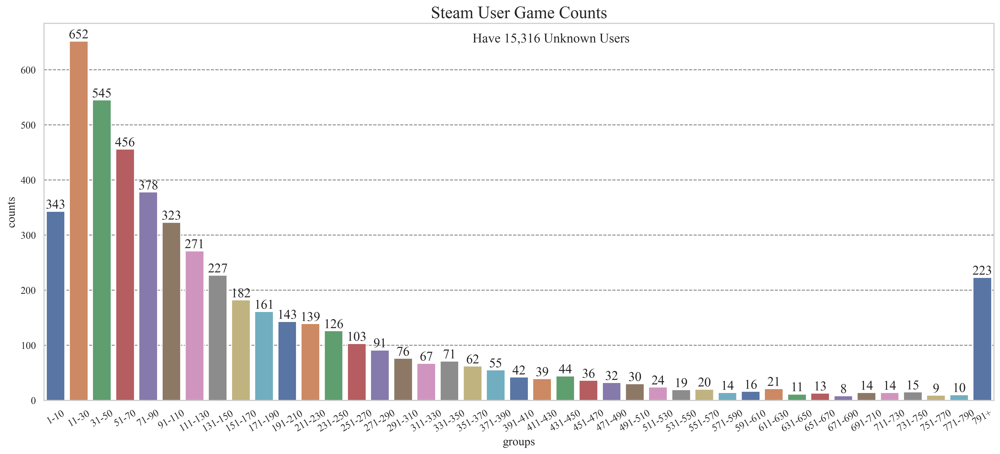

In [11]:
'''绘制柱形图'''

plt.xticks(rotation = 30) # 旋转横轴文字说明
plt.title(label='Steam User Game Counts')
ax = sns.barplot(data=game_count_df, x= 'groups', y= 'counts',hue='groups', palette='deep',legend=False)

# 添加注解
ax.text(x = 18, y = 650, s = 'Have 15,316 Unknown Users')
for bar in ax.patches:  # ax.patches是条形图的集合
    ax.text(x = bar.get_x() + bar.get_width() / 2,  # x坐标，条形图中心
            y = bar.get_height(),  # y坐标，条形图顶部
            s = int(bar.get_height()),  # 标签，即条形图的高度，转换为整数
            ha='center',  # 水平居中,Horizontal Alignment（水平对齐）
            va='bottom')  # 从条形图顶部向下对齐,Vertical Alignment（垂直对齐）


总体有如下结论：
-   **统计前提**：本次数据抓取前提条件是**付费游戏**。
-   **未知用户数量**：有15,316个未知用户（占比74.9%），这些用户设置了隐私权限且占比非常大，暂时无法判断这些用户属于哪些分组，这可能影响总体分析结果。
-   **游戏用户分布情况**：随游戏量增加，玩家数量越来越少，峰值出现在11-30分组。
-   **重度游戏玩家**：仍有相当一部分玩家游戏收藏数达到了400+（本人游戏数量为81），这是一个较高的数字，或许与国籍和账户创建时间有一定关系，待后续做回归分析。

#### 4. 识别有史以来最热门的游戏

In [12]:
# 使用正则表达式，其中"^"表示从字符串开始位置起，"?!"表示反向即不包含，"."表示任意字符，"*"表示任意数量，因此".*"表示任意字符任意数量，"|"表示逻辑与
game_info_before_tidy_up_df = df[[col for col in df.columns if re.search(r'^(?!.*2weeks)(name_game|playtime_forever_game|price_overview)', col)]]

In [13]:
# 将数据按照参数整理成三列
game_info_df = pd.DataFrame()
for i in range(0,len(game_info_before_tidy_up_df.columns),3):
    temp_df = game_info_before_tidy_up_df[game_info_before_tidy_up_df.columns[i:i+3]]
    temp_df.columns = ['game_name','playtime_foever_in_minutes','price_in_dollar']
    game_info_df = pd.concat([game_info_df,temp_df])

# 剔除Unknown数据
game_info_df = game_info_df[game_info_df['game_name'] != 'Unknown'] 

# 将每个游戏
grouped_game_info_df = game_info_df.groupby('game_name')['playtime_foever_in_minutes'].sum().reset_index()

In [14]:
# 将数据聚类，并作统计分析
game_info_grouped_df = game_info_df.groupby('game_name').agg({
    'game_name':['count'],
    'playtime_foever_in_minutes':['mean','median','max','min','std'],
    'price_in_dollar':['mean']}
)
# 进行特征工程，创建新参数
game_info_grouped_df[('playtime_foever_in_minutes', 'coefficient of variation')] = game_info_grouped_df[('playtime_foever_in_minutes','std')]/game_info_grouped_df[('playtime_foever_in_minutes','mean')]

# 提取核心数据
game_info_sorted_df = game_info_grouped_df[[('game_name', 'count'),('playtime_foever_in_minutes', 'median'),('price_in_dollar','mean')]]
game_info_sorted_df.columns = ['count','playtime_foever_in_minutes(median)','price_in_dollar']
sorted_flat_df = game_info_sorted_df.reset_index()

# 提取前20热门游戏
top_hotest_games = sorted_flat_df.nlargest(20,'count')
top_hotest_games

,game_name,count,playtime_foever_in_minutes(median),price_in_dollar
374,Counter-Strike2,3246,91152.0,0.0
1348,PUBG:BATTLEGROUNDS,1274,22659.0,0.0
828,GrandTheftAutoV,702,16382.5,0.0
1561,Rust,564,33796.5,39.0
377,Counter-Strike:Source,550,28837.0,9.0
373,Counter-Strike,537,10232.0,9.0
788,Garry'sMod,536,30030.0,4.0
1982,TomClancy'sRainbowSixSiege,456,24738.5,19.0
1540,RocketLeague,452,42574.5,0.0
92,ApexLegends,380,15927.0,0.0


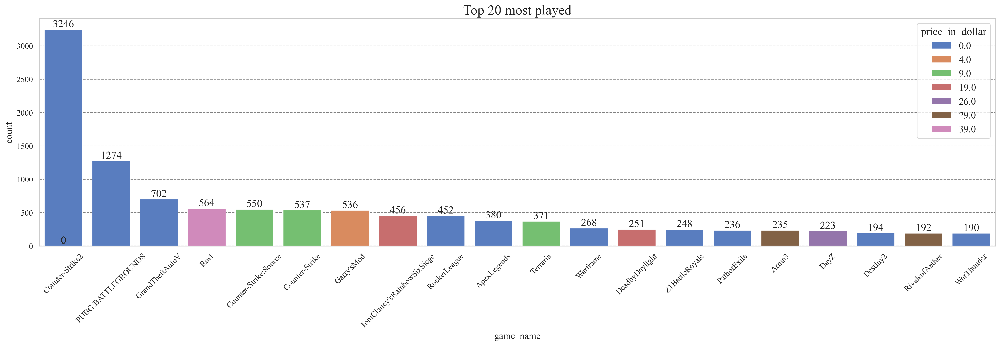

In [15]:
# 排序后查阅前20个游戏的上榜次数
plt.figure(figsize=(25,6))
plt.xticks(rotation = 45)
plt.title('Top 20 most played')
ax = sns.barplot(data=top_hotest_games, x='game_name',y='count',hue='price_in_dollar',palette='muted',)

# 添加数签
for bar in ax.patches:  # ax.patches是条形图的集合
    ax.text(x = bar.get_x() + bar.get_width() / 2,  # x坐标，条形图中心
            y = bar.get_height(),  # y坐标，条形图顶部
            s = int(bar.get_height()),  # 标签，即条形图的高度，转换为整数
            ha='center',  # 水平居中,Horizontal Alignment（水平对齐）
            va='bottom')  # 从条形图顶部向下对齐,Vertical Alignment（垂直对齐）

<Axes: title={'center': 'Playtime Distribution of Top 20 Games'}, xlabel='playtime_foever_in_minutes', ylabel='game_name'>

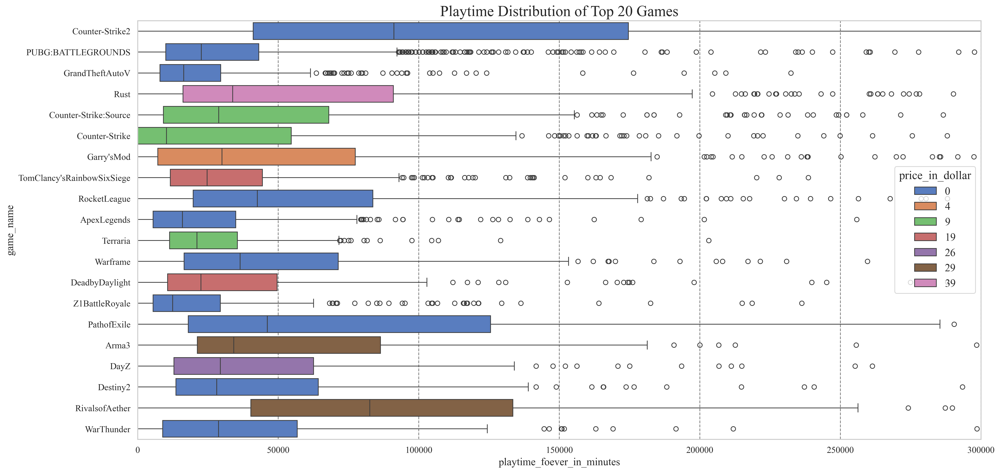

In [16]:
# 绘制箱型图，

# filter所有数据中排在counts前20的
top_20_games_data = game_info_df[game_info_df['game_name'].isin(top_hotest_games['game_name'])]
# 定义顺序，按照counts的大小从上到下依次排序
y_order = top_hotest_games['game_name']

plt.figure(figsize=(20, 10))
plt.title('Playtime Distribution of Top 20 Games')
plt.xlim(0, 300000)
sns.boxplot(data=top_20_games_data, x='playtime_foever_in_minutes', y='game_name', hue='price_in_dollar',palette='muted',order=y_order)

In [17]:
sorted_flat_df = sorted_flat_df[sorted_flat_df['count']>5]
top_playtime_games = sorted_flat_df.nlargest(20,'playtime_foever_in_minutes(median)')

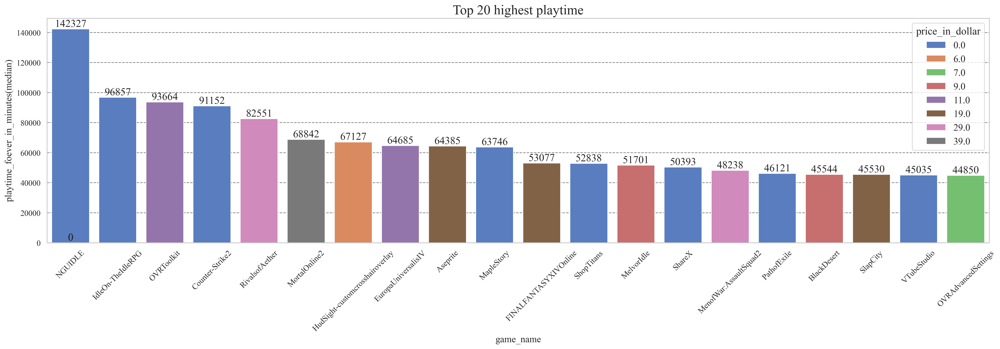

In [18]:
# 查阅前20热度游戏的游玩时间中位数情况
plt.figure(figsize=(25,6))
plt.xticks(rotation = 45)
plt.title('Top 20 highest playtime')
ax = sns.barplot(data=top_playtime_games, x='game_name',y='playtime_foever_in_minutes(median)',hue='price_in_dollar',palette='muted',)

# 添加数签
for bar in ax.patches:  # ax.patches是条形图的集合
    ax.text(x = bar.get_x() + bar.get_width() / 2,  # x坐标，条形图中心
            y = bar.get_height(),  # y坐标，条形图顶部
            s = int(bar.get_height()),  # 标签，即条形图的高度，转换为整数
            ha='center',  # 水平居中,Horizontal Alignment（水平对齐）
            va='bottom')  # 从条形图顶部向下对齐,Vertical Alignment（垂直对齐）

In [19]:
top_playtime_games

,game_name,count,playtime_foever_in_minutes(median),price_in_dollar
1251,NGUIDLE,14,142327.5,0.0
950,IdleOn-TheIdleRPG,11,96857.0,0.0
1297,OVRToolkit,8,93664.5,11.0
374,Counter-Strike2,3246,91152.0,0.0
1535,RivalsofAether,192,82551.5,29.0
1199,MortalOnline2,6,68842.0,39.0
933,HudSight-customcrosshairoverlay,10,67127.0,6.0
610,EuropaUniversalisIV,76,64685.5,11.0
109,Aseprite,27,64385.0,19.0
1128,MapleStory,17,63746.0,0.0


总体有如下结论：
- **免费游戏的玩家数量最多**：如 **Counter-Strike 2** 和 **PUBG: BATTLEGROUNDS**，这些游戏价格为0美元，吸引了大量玩家。
- **高游戏时长的游戏并不一定玩家数量多**：如 **NGUIDLE** 和 **IdleOn-TheIdleRPG**，尽管总游戏时长（中位数）很高，但上榜玩家数量为14、11，这是一个相对较小的群体。
- **某些付费游戏拥有高玩家投入**：如 **Rivals of Aether**，价格为29美元，但总游戏时长（中位数）很高，表明其玩家忠诚度较高。
- **不同类型游戏的吸引力**：尽管一些游戏价格较高（如 **Mortal Online 2** 和 **Europa Universalis IV**），但仍有较高的总游戏时长，表明这些游戏可能在特定玩家群体中非常受欢迎。


#### 5. 近两周以来最热门的游戏

In [20]:
# 使用正则表达式，其中"^"表示从字符串开始位置起，"?!"表示反向即不包含，"."表示任意字符，"*"表示任意数量，因此".*"表示任意字符任意数量，"|"表示逻辑与
game_info_before_tidy_up_df = df[[col for col in df.columns if re.search(r'^(name_game|playtime_|price_overview).*2weeks', col)]]

In [21]:
# 将数据按照参数整理成三列
game_info_2weeks_df = pd.DataFrame()
for i in range(0,len(game_info_before_tidy_up_df.columns),4):
    temp_df = game_info_before_tidy_up_df[game_info_before_tidy_up_df.columns[i:i+4]]
    temp_df.columns = ['game_name','playtime_2weeks_in_minutes','playtime_foever_in_minutes','price_in_dollar']
    game_info_2weeks_df = pd.concat([game_info_2weeks_df,temp_df])

In [22]:
game_info_2weeks_df = game_info_2weeks_df[game_info_2weeks_df['game_name'] != 'Unknown'] # 剔除Unknown数据

In [23]:
# 将数据聚类，并作统计分析
game_info_2weeks_grouped_df = game_info_2weeks_df.groupby('game_name').agg({
    'game_name':['count'],
    'playtime_2weeks_in_minutes':['mean','median','max','min','std'],
    'price_in_dollar':['mean']}
)
# 进行特征工程，创建新参数
game_info_2weeks_grouped_df[('playtime_2weeks_in_minutes', 'coefficient of variation')] = game_info_2weeks_grouped_df[('playtime_2weeks_in_minutes','std')]/game_info_2weeks_grouped_df[('playtime_2weeks_in_minutes','mean')]

In [24]:
# 提取核心数据
game_info_2weeks_sorted_df = game_info_2weeks_grouped_df[[('game_name', 'count'),('playtime_2weeks_in_minutes', 'median'),('price_in_dollar','mean')]]
game_info_2weeks_sorted_df.columns = ['count','playtime_2weeks_in_minutes(median)','price_in_dollar']
game_info_2weeks_sorted_df = game_info_2weeks_sorted_df.reset_index()

In [25]:
top_hotest_2_weeks_games = game_info_2weeks_sorted_df.nlargest(20,'count')

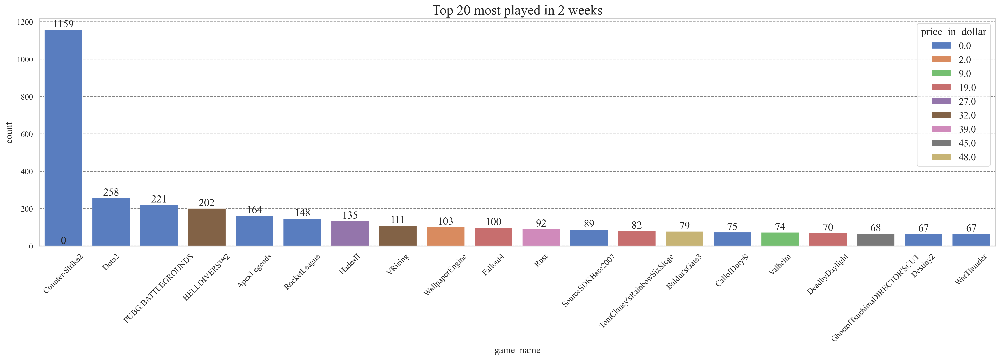

In [26]:
# 排序后查阅前20个游戏的上榜次数
plt.figure(figsize=(25,6))
plt.xticks(rotation = 45)
plt.title('Top 20 most played in 2 weeks')
ax = sns.barplot(data=top_hotest_2_weeks_games, x='game_name',y='count',hue='price_in_dollar',palette='muted',)

# 添加数签
for bar in ax.patches:  # ax.patches是条形图的集合
    ax.text(x = bar.get_x() + bar.get_width() / 2,  # x坐标，条形图中心
            y = bar.get_height(),  # y坐标，条形图顶部
            s = int(bar.get_height()),  # 标签，即条形图的高度，转换为整数
            ha='center',  # 水平居中,Horizontal Alignment（水平对齐）
            va='bottom')  # 从条形图顶部向下对齐,Vertical Alignment（垂直对齐）

In [27]:
# 绘制小提琴图

# filter所有数据中排在counts前20的
top_20_games_data = game_info_2weeks_df[game_info_2weeks_df['game_name'].isin(top_hotest_2_weeks_games['game_name'])]
# 定义顺序，按照counts的大小从上到下依次排序
y_order = top_hotest_2_weeks_games['game_name']

plt.figure(figsize=(15, 70))
plt.title('Playtime Distribution of Top 20 Games in two weeks')
plt.xlim(0, 7000)
sns.violinplot(data=top_20_games_data, x='playtime_2weeks_in_minutes', y='game_name', hue='price_in_dollar',palette='muted',order=y_order)

<Axes: title={'center': 'Playtime Distribution of Top 20 Games in two weeks'}, xlabel='playtime_2weeks_in_minutes', ylabel='game_name'>

#### 6. 识别近期开发商与发行商

In [28]:
# 抓取近期开发商与发行商
dev_and_pub_before_tidy_df = df[[col for col in df.columns if re.search(r'^(publisher|developer).*2weeks',col)]]

In [29]:
# 将数据整理为2列
dev_and_pub_df = pd.DataFrame()
for i in range(0, len(dev_and_pub_before_tidy_df.columns), 2):
    temp_df = dev_and_pub_before_tidy_df[dev_and_pub_before_tidy_df.columns[i:i+2]]
    temp_df.columns = ['developers','publishers']
    dev_and_pub_df = pd.concat([dev_and_pub_df,temp_df]).reset_index(drop= True)
dev_se = dev_and_pub_df['developers']
pub_se = dev_and_pub_df['publishers']

# 将数据转换成原始数据类型
dev_se = dev_se[dev_se !='Unknown']
dev_se = dev_se.apply(lambda x: literal_eval(x) if pd.notna(x) else x) # 使用literal_eval转变str为原始数据类型

pub_se = pub_se[pub_se !='Unknown']
pub_se = pub_se.apply(lambda x: literal_eval(x) if pd.notna(x) else x) # 使用literal_eval转变str为原始数据类型

# 将数据统计到字典
dev_dict = {}
for dev_list in dev_se:
    for dev in dev_list:
        if dev in dev_dict:
            dev_dict[dev] +=1
        else:
            dev_dict[dev] = 1

pub_dict = {}
for pub_list in pub_se:
    for pub in pub_list:
        if pub in pub_dict:
            pub_dict[pub] +=1
        else:
            pub_dict[pub] = 1

# 整理成Series格式
grouped_dev_se = pd.Series(dev_dict)
grouped_pub_se = pd.Series(pub_dict)

# 整理成DataFrame格式
grouped_dev_df = grouped_dev_se.reset_index()
grouped_pub_df = grouped_pub_se.reset_index()

# 改变columns名称
grouped_dev_df.columns = ['developers','counts']
grouped_pub_df.columns = ['publishers','counts']

# 筛选前20位开发商以及发行商
top_20_dev_df = grouped_dev_df.nlargest(20,'counts').reset_index(drop=True)
top_20_pub_df = grouped_pub_df.nlargest(21,'counts').reset_index(drop=True)

# 剔除空值
top_20_pub_df.drop(10,inplace=True)

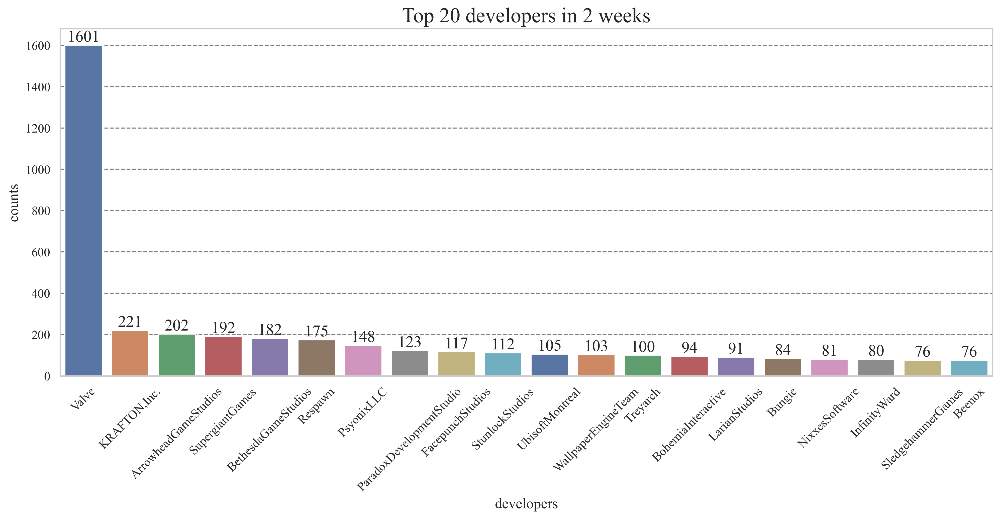

In [30]:
'''绘制有关developers的柱状图'''
plt.figure(figsize=(16,6))
plt.title('Top 20 developers in 2 weeks')
plt.xticks(rotation = 45)
ax = sns.barplot(data=top_20_dev_df, x='developers', y='counts', hue='developers', palette='deep')

# 添加数签
for bar in ax.patches:  # ax.patches是条形图的集合
    ax.text(x = bar.get_x() + bar.get_width() / 2,  # x坐标，条形图中心
            y = bar.get_height(),  # y坐标，条形图顶部
            s = int(bar.get_height()),  # 标签，即条形图的高度，转换为整数
            ha='center',  # 水平居中,Horizontal Alignment（水平对齐）
            va='bottom')  # 从条形图顶部向下对齐,Vertical Alignment（垂直对齐）

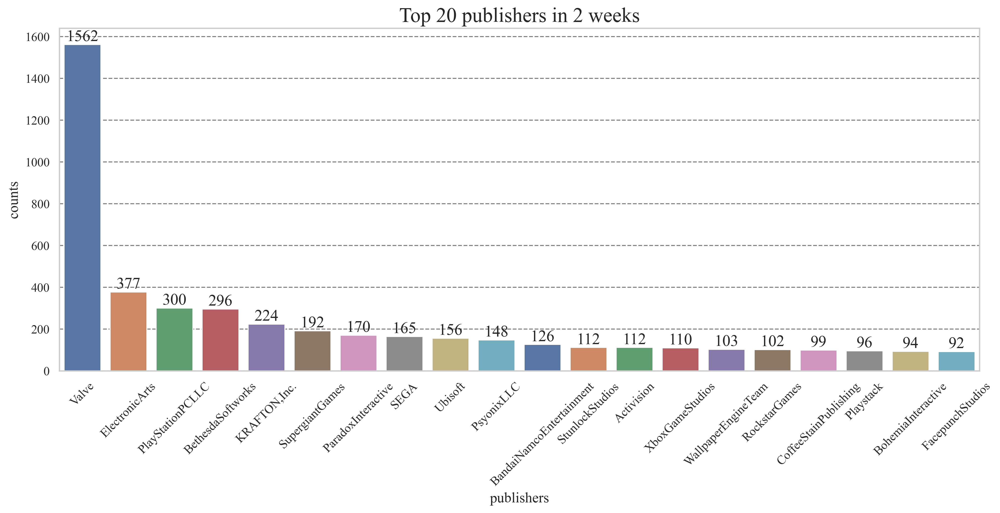

In [31]:
'''绘制有关developers的柱状图'''
plt.figure(figsize=(16,6))
plt.title('Top 20 publishers in 2 weeks')
plt.xticks(rotation = 45)
ax = sns.barplot(data=top_20_pub_df, x='publishers', y='counts', hue='publishers', palette='deep')

# 添加数签
for bar in ax.patches:  # ax.patches是条形图的集合
    ax.text(x = bar.get_x() + bar.get_width() / 2,  # x坐标，条形图中心
            y = bar.get_height(),  # y坐标，条形图顶部
            s = int(bar.get_height()),  # 标签，即条形图的高度，转换为整数
            ha='center',  # 水平居中,Horizontal Alignment（水平对齐）
            va='bottom')  # 从条形图顶部向下对齐,Vertical Alignment（垂直对齐）

总体有如下结论：
-   **Valve**不仅在开发者中遥遥领先，而且在发行商中也占据主导地位,旗下有多个热门ip（半条命、传送门、军团要塞、反恐精英、Dota等），同时也是steam平台服务提供商。
-   发行商普遍计数高于开发商，这符合认知理解（一个大的游戏公司可能会有多个开发团队）。
-   双重身份：**Supergiant Games**和**Bethesda**也是既有开发者排名又有发行商排名的公司，显示了它们在游戏开发和发行中的双重角色。
-   大部分开发者和发行商排名靠前的公司都在100次提及或关联以上，显示了这些公司的高活跃度和市场存在感，是流量游戏开发时候的标杆。

#### 7. 识别游戏价格密度分布情况

In [32]:
# 提取数据并整理成平数据
count_and_price_df= game_info_2weeks_grouped_df[[('game_name','count'),( ('price_in_dollar','mean'))]]
count_and_price_df.columns = ['count','price_in_dollar']
count_and_price_df = count_and_price_df.reset_index()

# 剔除价值为0的游戏
count_and_price_df = count_and_price_df[count_and_price_df['price_in_dollar'] != 0.0]

<Axes: xlabel='price_in_dollar', ylabel='Density'>

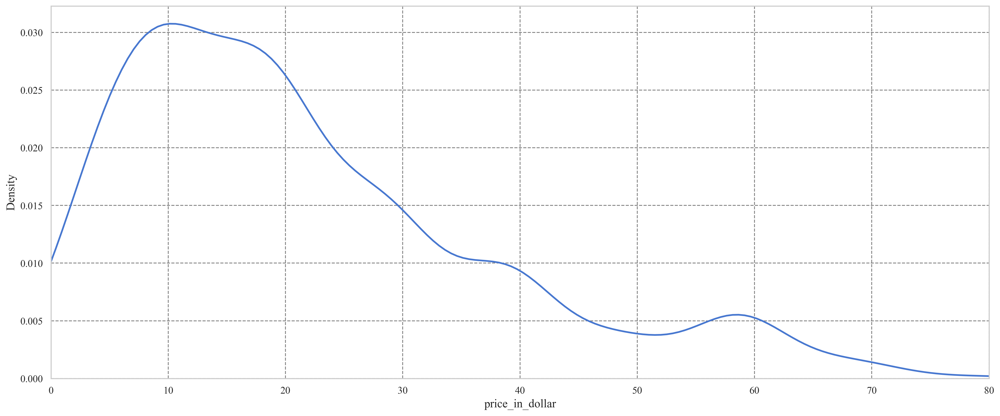

In [33]:
'''绘制kdeplot(Kernel Density Estimation)'''
plt.figure(figsize=(20,8))
plt.xlim(0,80)
sns.kdeplot(x=count_and_price_df['price_in_dollar'])

总体有如下结论：
-   **价格集中在低价位**：从核函数图像形状可以看出，绝大多数游戏的价格集中在较低的价格区间（0-20美元）。图中的宽度表示数据的密度，宽度越大表示该价格区间的游戏数量越多。
-   **次要峰值**：在40美元左右和60美元左右（59.9一般对应着3A大作），图中显示了两个较小的次要峰值。虽然这些峰值不如10美元左右的主峰明显，但它们仍然表示在这些价格附近有一些游戏的集中。
-   **长尾分布**：价格分布呈现长尾分布，右侧尾部较长。这意味着有一些游戏价格较高，但数量相对较少，后续可以进一步观察为何游戏如此定价。
-   **存在谷值**：在50美元区域存在一个密度的下降。

### 多维度数据可视化——相关性分析

#### 1. 分析玩家所属国家与玩家游戏数量的联系

In [34]:
# 提取所需列，并根据单维度分析时的聚合信息，做后续准备
country_vs_game_df = df[['loccountrycode','game_count']]
top_20_country_vs_game_data_df = grouped_country_se.nlargest(20,'count')

# 筛选所属国为前20的玩家
top_20_country_vs_game_data = country_vs_game_df[country_vs_game_df['loccountrycode'].isin(top_20_country_vs_game_data_df['loccountrycode'])]

<Axes: title={'center': 'Game purchases by country'}, xlabel='game_count', ylabel='loccountrycode'>

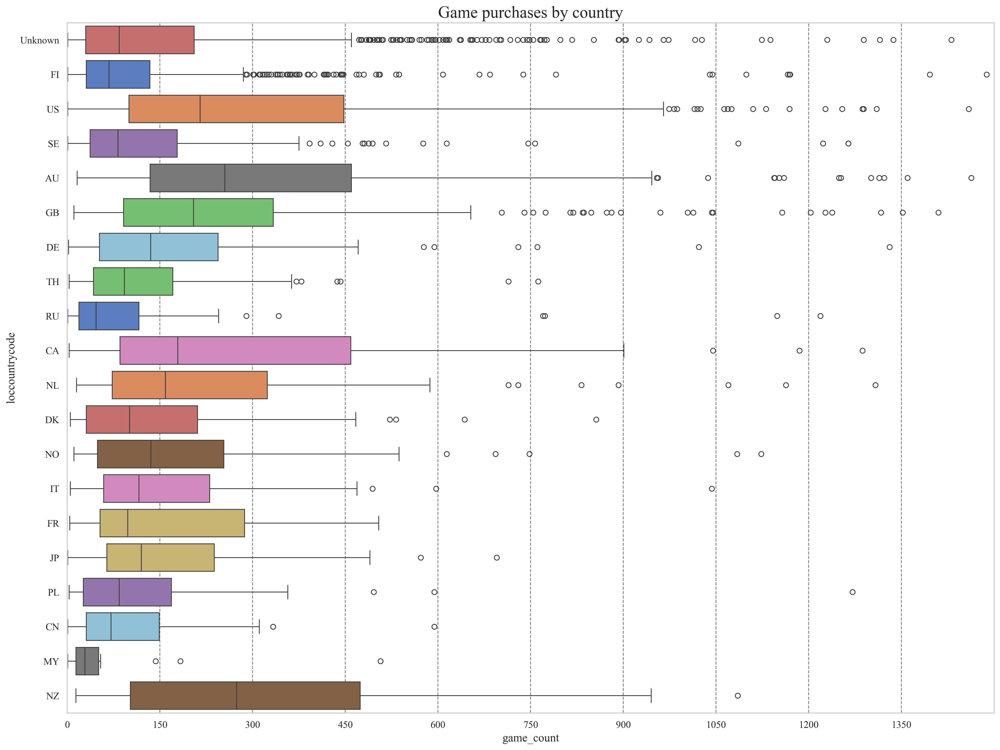

In [35]:
# 绘制箱型图

# filter所有数据中排在counts前20的
top_20_country_vs_game_data = country_vs_game_df[country_vs_game_df['loccountrycode'].isin(top_20_country_vs_game_data_df['loccountrycode'])]

# 去除0值
top_20_country_vs_game_data = top_20_country_vs_game_data[top_20_country_vs_game_data['game_count'] != 0]

# 定义顺序，按照counts的大小从上到下依次排序
y_order = top_20_country_vs_game_data_df['loccountrycode']

plt.figure(figsize=(20, 15))
plt.title('Game purchases by country')
plt.xlim(0,1500)
plt.xticks(range(0, 1500, 150))


sns.boxplot(data=top_20_country_vs_game_data, x='game_count', y='loccountrycode', hue='loccountrycode',palette='muted',order=y_order)



-   美国、加拿大、荷兰和新西兰等大多欧美玩家购买游戏数量总体较多，且分布范围较广，显示出这些国家的玩家在游戏消费上的多样性和活跃度。
-   芬兰虽然整体游戏购买数量较少，但存在大量离群值，数据应该与起始点有关，因为起始点。
-   俄罗斯、马来西亚、中国、日本等亚洲地区玩家购买游戏数量总体较少，且分布较集中，离群值较少，显示出这些国家的玩家在游戏消费上的相对一致性和较低的购买数量。
-   大部分国家的购买数量分布集中在中等范围，但存在一些高异常值，表明这些国家中有部分玩家购买了大量的游戏。
-   购买游戏或许跟**收入、工作之余休息时间、玩家整体偏好**等因素有关。

#### 2. 分析游戏类型的占比情况

In [36]:
# 提取涉及genre游玩时间的列
genre_weighted_playtime_df = df[[col for col in df.columns if re.search(r'^.*(weighted)',col)]]
# 计算每种类型游玩时间
genre_weighted_playtime_df = genre_weighted_playtime_df.sum()
genre_weighted_playtime_df = genre_weighted_playtime_df.reset_index()
genre_weighted_playtime_df.columns = ['genre','playtime_in_minutes']
genre_weighted_playtime_df.sort_values(by='playtime_in_minutes',ascending=False,inplace=True)

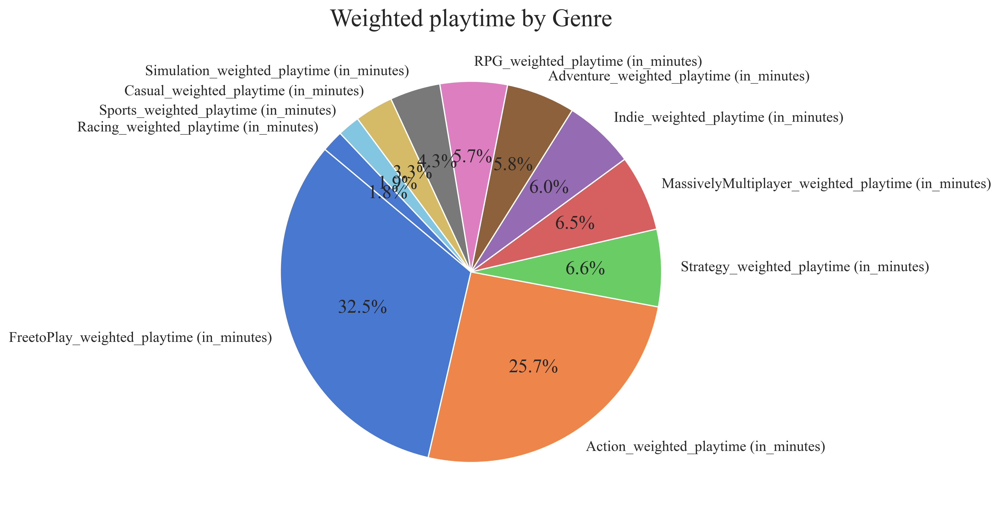

In [37]:
# 定义饼图的颜色，使用Seaborn的调色板
colors = sns.color_palette('muted', len(df))

# 绘制饼图
plt.figure(figsize=(10, 7))
plt.pie(genre_weighted_playtime_df['playtime_in_minutes'], labels=genre_weighted_playtime_df['genre'], autopct='%1.1f%%', colors=colors, startangle=140)
plt.title('Weighted playtime by Genre')
plt.show()

#### 3. 分析近期游戏的价格与上榜次数count之间的关系
(剔除价格为0的游戏)

In [38]:
# 提取数据并整理成平数据
count_and_price_df= game_info_2weeks_grouped_df[[('game_name','count'),( ('price_in_dollar','mean'))]]
count_and_price_df.columns = ['count','price_in_dollar']
count_and_price_df = count_and_price_df.reset_index()

# 剔除价值为0的游戏
count_and_price_df = count_and_price_df[count_and_price_df['price_in_dollar'] != 0.0]

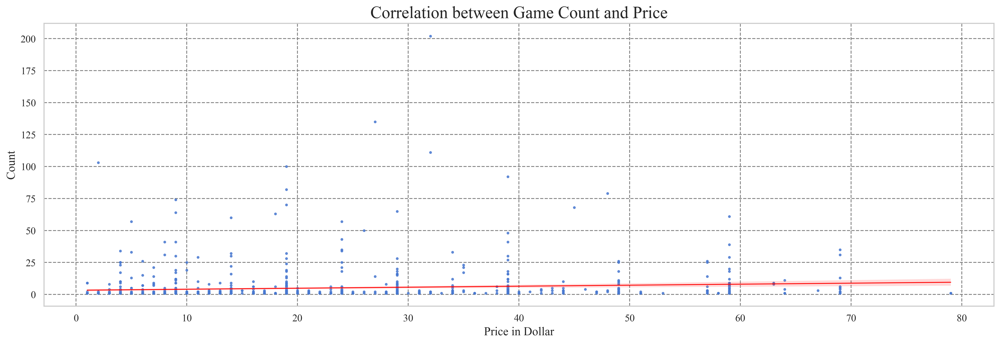

In [39]:
'''绘制回归图'''

plt.figure(figsize=(20, 6))
sns.regplot(data=count_and_price_df, x='price_in_dollar', y='count', scatter_kws={'s': 5}, line_kws={'color': 'red', 'lw': 1}) # s设置散点大小，color设置回归线的颜色
plt.title('Correlation between Game Count and Price')
plt.xlabel('Price in Dollar')
plt.ylabel('Count')
plt.show()

总体有如下结论：
- **回归线的斜率**：回归线几乎是水平的，这意味着价格和数量之间没有明显的线性关系。无论价格如何变化，数量的变化都没有显著的趋势。
- **数据变异性大**：数据大多都分布在置信区间外，表明数据点之间的差异很大，价格对数量的影响不确定。

#### 4. 分析metacritic得分与上榜次数count之间的关系
(剔除没有得分的游戏)

In [40]:
# 提取相关列
score_and_counts_before_tidy_up_df = df[[col for col in df.columns if re.search(r'^.*(name_game|metacritic)',col)]]

# 整理成标准格式
score_and_counts_df = pd.DataFrame()
for i in range(0,len(score_and_counts_before_tidy_up_df.columns),2):
    temp_df = score_and_counts_before_tidy_up_df[score_and_counts_before_tidy_up_df.columns[i:i+2]]
    temp_df.columns = ['game_name','metacritic_score']
    score_and_counts_df = pd.concat([score_and_counts_df,temp_df])
    
# 剔除得分不详的游戏
score_and_counts_df = score_and_counts_df[(score_and_counts_df['metacritic_score'] != 'Unknown') & (score_and_counts_df['metacritic_score'] != 'No score')]

# 整理数据类型
score_and_counts_df['metacritic_score'] = score_and_counts_df['metacritic_score'].apply(lambda x: literal_eval(x) if pd.notna(x) else x)

# 进行groupby
score_and_counts_grouped_df = score_and_counts_df.groupby('game_name').agg({
    'game_name':['count'],
    'metacritic_score':['mean']
})

# 整理df成平列表
score_and_counts_grouped_df.columns = ['count','metacritic_score']
score_and_counts_grouped_df = score_and_counts_grouped_df.reset_index()


<Axes: title={'center': 'Polynomial Regression with Seaborn (No Confidence Interval)'}, xlabel='metacritic_score', ylabel='count'>

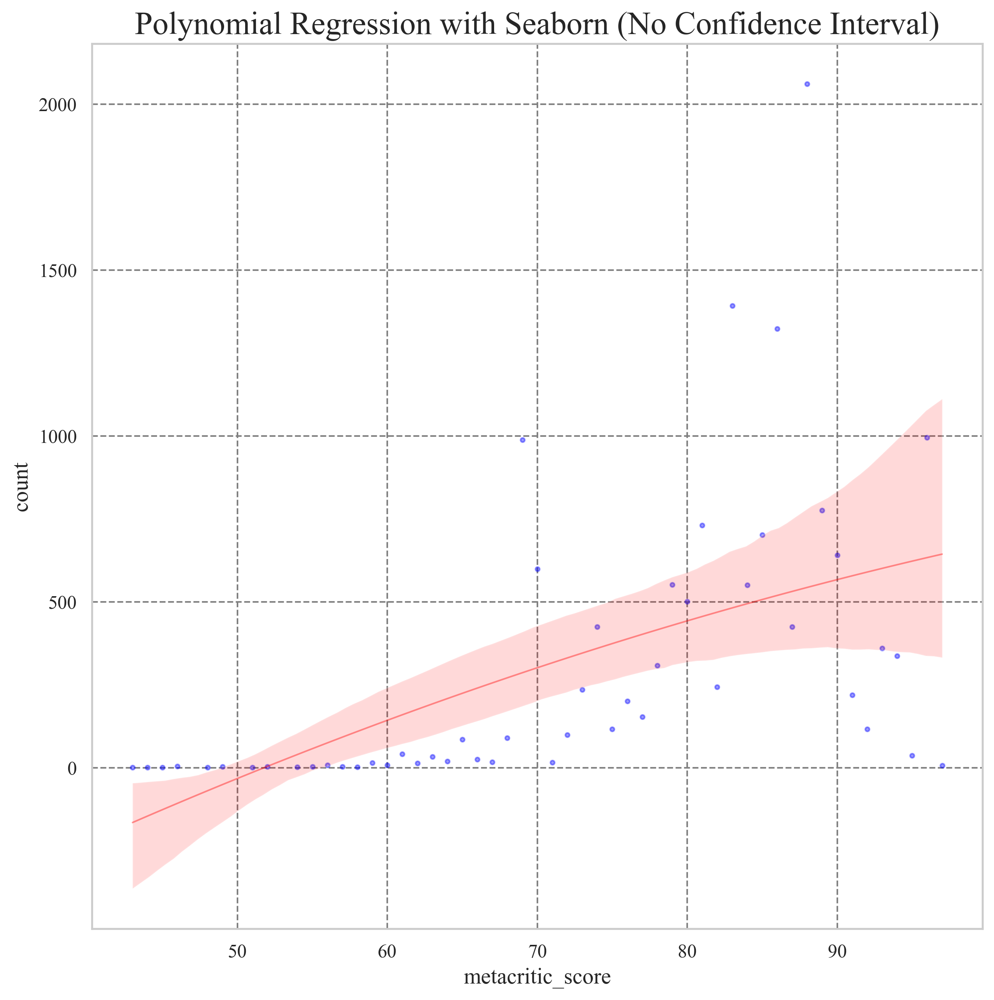

In [41]:
data = score_and_counts_grouped_df
# 创建适用的数据框
heatmap_data = data.groupby('metacritic_score')['count'].sum().reset_index()

# 绘制多项式回归分析图
plt.figure(figsize=(10,10))
plt.title('Polynomial Regression with Seaborn (No Confidence Interval)')

sns.regplot(data = heatmap_data, x='metacritic_score', y='count', order=2, ci=95, scatter_kws={"color": "blue", "alpha": 0.4, 's': 7}, line_kws={"color": "red","alpha": 0.4, 'lw':1}) # ci: confidence interval

总体有如下结论：
-   **正相关性**：多项式回归中显示了一条向上的趋势线，这表明随着Metacritic评分的提高，游戏的计数也倾向于增加。这可能意味着评分较高的游戏更受欢迎，或者更容易被人们记住和讨论。
-   **数据分布**：大多数低分游戏的计数较低（靠近x轴），高于70分的作品表现得更为流行。但并不意味着最高的得分拥有最高的count次数。
-   **置信区间**：粉红色的区域代表了置信区间，用来表示预测的不确定性。这个区间随着 metacritic_score 的增加而变宽，特别是在得分较高时，表明在高评分区域的预测不确定性较大。
-   **潜在问题**：考虑到置信区间在高分值处明显扩展，这可能表明模型在这一区间的预测力不足或数据点较少。

### PCA & K-MEANS CLUSTER 用户群体定位可视化
具体机器学习模型应用部分请看[notebook](../5.machine_learning/unsupervise_learning_PCA_and_KMEANS_for_player_cluster.ipynb)

#### 1. 簇群分析

In [42]:
# 读取分组数据
cluster_df = pd.read_csv('../5.machine_learning/data/cluster_analysis_for_hot_map.csv')
cluster_df.drop(6,inplace=True)
cluster_df.drop(columns='Group_label',inplace=True)

# 数据归一化处理
scaler = MinMaxScaler()
cluster_normalized_df = pd.DataFrame(scaler.fit_transform(cluster_df), columns=cluster_df.columns)
cluster_normalized_df.sort_values('headcount',ascending=False,inplace=True)

# 给分组命名
cluster_normalized_df.index = ['Rookies', 'Casual Players', 'Game Collectors ', 'Online Gamers', 'Sports Gamers', 'Core Gamers']

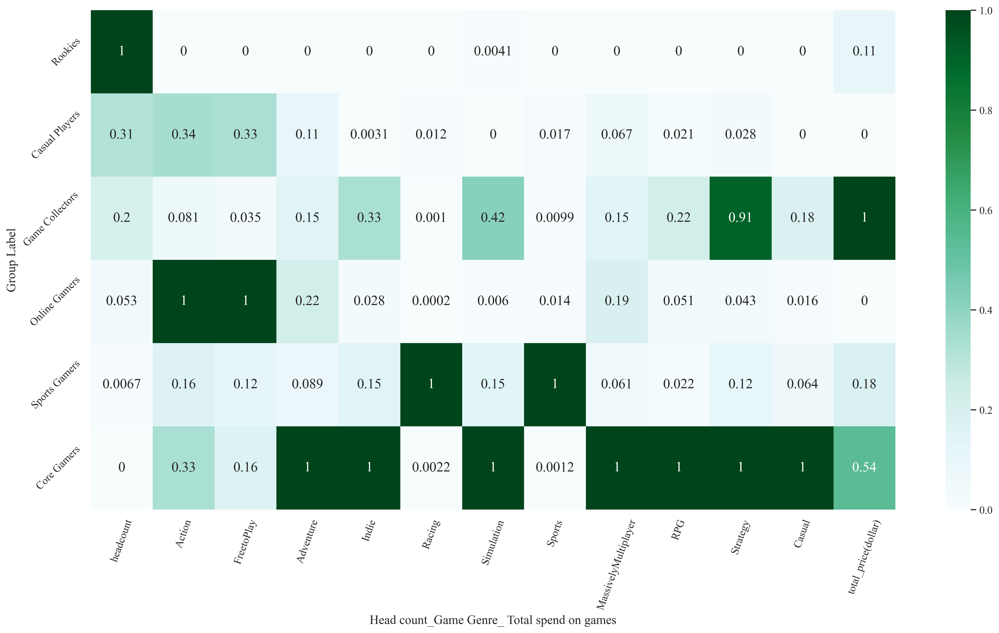

In [43]:
# 绘制热力图

plt.figure(figsize=(20, 10))  # 调整图像尺寸
sns.heatmap(data = cluster_normalized_df, annot=True, cmap='BuGn', )  # 调整注释字体大小和颜色
plt.xlabel('Head count_Game Genre_ Total spend on games')
plt.ylabel('Group Label')
plt.xticks(rotation = 70)
plt.yticks(rotation = 45)
plt.show()


In [44]:
# 展示实际数据
cluster_df.sort_values('headcount',ascending=False)

,headcount,Action,FreetoPlay,Adventure,Indie,Racing,Simulation,Sports,MassivelyMultiplayer,RPG,Strategy,Casual,total_price(dollar)
0,3502.0,26977.0,30578.0,5971.0,6022.0,1953.0,4239.0,2275.0,4435.0,5533.0,9276.0,2769.0,61.0
2,1155.0,139666.0,192376.0,21925.0,6545.0,3787.0,3806.0,4351.0,20066.0,9744.0,11001.0,2769.0,53.0
3,767.0,53868.0,47478.0,28477.0,61759.0,2105.0,48293.0,3495.0,38883.0,49720.0,64249.0,30256.0,129.0
1,265.0,357280.0,518181.0,38983.0,10660.0,1983.0,4435.0,3970.0,49585.0,15824.0,11906.0,5223.0,53.0
4,107.0,80501.0,87879.0,19295.0,31117.0,150268.0,19258.0,125996.0,18703.0,9956.0,16344.0,12786.0,67.0
5,84.0,137474.0,110801.0,156264.0,172544.0,2274.0,109382.0,2420.0,237264.0,207390.0,69952.0,158533.0,94.0


总体有如下结论：
-   **玩家类型分布**：大多数玩家(79.2%)，为轻度玩家（Rookies& Casual players）
-   **玩家购买潜力**：13%的玩家（Game Collectors）有较强的购买潜力，但购买力强并不绝对意味着游玩时间相较其他分组更强。
-   **核心玩家**：1.4%的玩家可以称为核心玩家（Core Gamers），这类玩家在多项游戏中均游玩时间占据前列。
-   **潜在问题**：
    -   本次数据量较小：对于无监督机器学习精度会有一定影响，可能无法捕捉到数据的真实结构；
    -   参数多：在面对高维数据时，会存在“维度灾难”。高维空间中，数据点之间的距离差异变得不明显（即所有点几乎等距离），这使得基于距离的算法（如 K-means 使用欧几里得距离）效果下降。
    -   PCA：主成分分析（PCA）通常用于降维处理，通过保留数据中的主要成分来减少参数数量。这对于减轻维度灾难有一定帮助，但如果保留的主成分不能代表全部关键变量，可能会丢失重要信息。

#### 2. 不同国籍非休闲玩家分布情况

In [45]:
# 提取数据
country_cluster_df = df[df.columns[[15,119]]]

# 数据清洗
country_cluster_df.dropna(subset='Cluster_Labels',inplace=True)
country_cluster_df.reset_index(drop=True,inplace=True)

# 筛选前30的国家
top_30_country_cluster_df = country_cluster_df[country_cluster_df['loccountrycode'].isin(grouped_country_top_30_se['loccountrycode'])]

# 数据整合并平整
top_30_grouped_country_cluster_df = top_30_country_cluster_df.groupby(['loccountrycode', 'Cluster_Labels']).agg({
    'Cluster_Labels': ['count']
})
top_30_grouped_country_cluster_df.columns = ['count']
top_30_grouped_country_cluster_df = top_30_grouped_country_cluster_df.reset_index()

# 筛去Rookie类用户
data = top_30_grouped_country_cluster_df
Cluster_for_analyze = [1.0, 2.0, 3.0, 4.0, 5.0]
data = data[data['Cluster_Labels'].isin(Cluster_for_analyze)]

# 计算每个国家的总计数
total_counts = data.groupby('loccountrycode')['count'].sum()

# 计算每个群体标签的比例
data['proportion'] = data.apply(lambda row: row['count'] / total_counts[row['loccountrycode']], axis=1)

# 生成数据透视表，以便绘制堆叠柱状图
pivot_df = data.pivot_table(index='loccountrycode', columns='Cluster_Labels', values='proportion', fill_value=0)
pivot_df.columns = [ 'Casual Players', 'Game Collectors ', 'Online Gamers', 'Sports Gamers', 'Core Gamers']
pivot_df = pivot_df.reindex(grouped_country_top_30_se['loccountrycode'])
pivot_df.dropna(inplace=True)

C:\Users\55386\AppData\Local\Temp\ipykernel_15076\3010861631.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_cluster_df.dropna(subset='Cluster_Labels',inplace=True)
C:\Users\55386\AppData\Local\Temp\ipykernel_15076\3010861631.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['proportion'] = data.apply(lambda row: row['count'] / total_counts[row['loccountrycode']], axis=1)


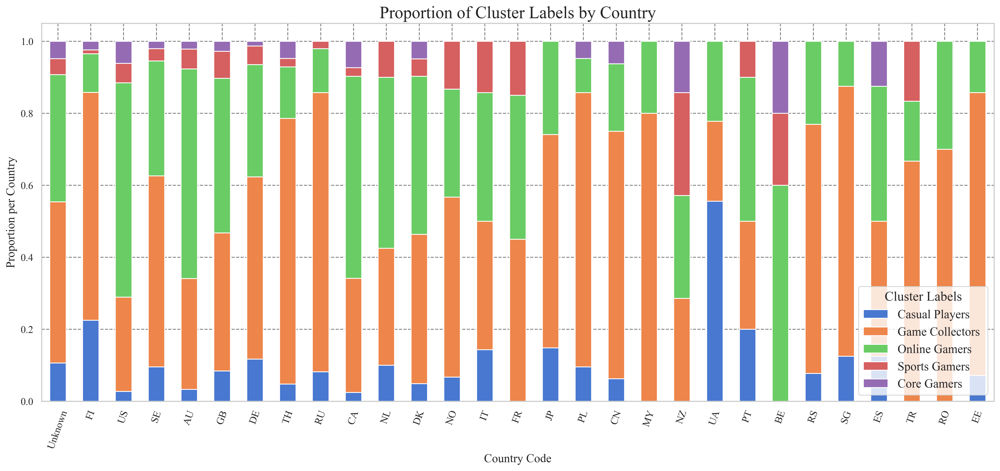

In [46]:

# 绘制堆叠柱状图
pivot_df.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Cluster Labels by Country')
plt.xlabel('Country Code')
plt.ylabel('Proportion per Country')
plt.legend(title='Cluster Labels')
plt.xticks(rotation = 70)
plt.show()

总体有如下结论：
-   **体育类游戏的地区差异性**：热衷于体育游戏的多分布于欧洲地区。
-   **核心玩家**：比利时（BE）、西班牙（ES）、挪威（NZ）等欧洲地区国家有相对较大比例的核心玩家，同时中国也有一定比例的核心玩家，这对于后续市场推广有一定参考价值。
-   **潜在问题**：
    -   数据量较小，且存在大量不愿意展示游戏列表的玩家，或许这些玩家有特定的游戏偏好不愿意展示。
    -   初始数据抓取模式可能会造成数据有偏，因为采用的是随机初始点开始的广度优先搜索（Breadth-first search），因此后续的搜索点一定程度上会受到初始点的偏向。
    -   受时间影响，因为爆款游戏的出现会对整体市场游戏偏向造成影响，例如近期爆款的Helldriver2与Palworld。